In [ ]:
!pip install ipyleaflet
!pip install pystac
!pip install pystac-client
!pip install odc-stac
!pip install planetary_computer
!pip install rich

In [ ]:
!pip install rioxarray
!pip install stackstac
!pip install pystac_client
!pip install xarray-spatial


In [ ]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Visualization
import ipyleaflet
import matplotlib.pyplot as plt
from IPython.display import Image
import seaborn as sns

# Data Science
import numpy as np
import pandas as pd

# Feature Engineering
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Machine Learning
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, accuracy_score,classification_report,confusion_matrix

# Planetary Computer Tools
import pystac
import pystac_client
import odc
from pystac_client import Client
from pystac.extensions.eo import EOExtension as eo
from odc.stac import stac_load
import planetary_computer as pc
pc.settings.set_subscription_key('a3c4c316e87343409b76ed38fbd23967')

# Others
import requests
import rich.table
from itertools import cycle
from tqdm import tqdm
tqdm.pandas()

In [ ]:
import pandas as pd

In [ ]:
from pathlib import Path
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
base_path = Path('/content/drive/MyDrive/data/')

In [ ]:
data = base_path/'datasets'

In [ ]:
for items in data.iterdir():
  print(items.name)

poldata.README.2.0
cifar-10-batches-py
spam.csv
MNIST
FashionMNIST
.ipynb_checkpoints
fastai-2022
paddy-disease-classification
purdue-data-for-good
HW_8
trump_tweets.csv
COVID.csv
training.1600000.processed.noemoticon.csv
txt_sentoken
scale_whole_review
scaledata.README.1.0.txt
ungdc_cleaned_df.joblib
aclImdb
imdb
Crop_Location_Data.csv


In [ ]:
location = '/content/drive/MyDrive/EY_Challenge/Level 1 Crop Identification/challenge_1_submission_template_correct_columns_fixed.csv'
sub_data = pd.read_csv(location)
sub_data

,Latitude and Longitude,Class of Land
0,"(10.323727047081501, 105.2516346045924)",Rice
1,"(10.322364360592521, 105.27843410554115)",Rice
2,"(10.321455902933202, 105.25254306225168)",Rice
3,"(10.324181275911162, 105.25118037576274)",Rice
4,"(10.324635504740822, 105.27389181724476)",Rice
...,...,...
595,"(10.013942985253381, 105.67361318732796)",Non Rice
596,"(10.01348875642372, 105.67361318732796)",Non Rice
597,"(10.013034527594062, 105.67361318732796)",Non Rice
598,"(10.012580298764401, 105.67361318732796)",Non Rice


In [ ]:
crop_presence_data[['Class of Land']].value_counts()

Class of Land
Non Rice         300
Rice             300
dtype: int64

# Function to get To get the Sentinel-1 data

In [ ]:
resolution = 10  # meters per pixel 
scale = resolution / 111320.0 # degrees per pixel for crs=4326 

In [ ]:
#function get_sentinel_data to fetch VV and VH band values for a particular location over the specified time window.
def get_sentinel_data(latlong,time_slice,assets): # a function to get vv and vh 
    '''
    Returns VV and VH values for a given latitude and longitude 
    Attributes:
    latlong - A tuple with 2 elements - latitude and longitude
    time_slice - Timeframe for which the VV and VH values have to be extracted
    assets - A list of bands to be extracted
    '''

    latlong=latlong.replace('(','').replace(')','').replace(' ','').split(',')
    bbox_of_interest = (float(latlong[1]) , float(latlong[0]), float(latlong[1]) , float(latlong[0]))
    time_of_interest = time_slice

    catalog = pystac_client.Client.open(
        "https://planetarycomputer.microsoft.com/api/stac/v1"
    )
    search = catalog.search(
        collections=["sentinel-1-rtc"], bbox=bbox_of_interest, datetime=time_of_interest
    )
    items = list(search.get_all_items())
    #bands_of_interest = po
    data = stac_load([items[0]], patch_url=pc.sign, bbox=bbox_of_interest,crs="EPSG:4326", resolution=scale).isel(time=0)
    vh = data["vh"].astype("float").values.tolist()[0][0]
    vv = data["vv"].astype("float").values.tolist()[0][0]
    return vh,vv

In [ ]:
# Building a bounding box (e.g., 5x5 pixels) around the given latitude and longitude positions and then 
#extract the aggregated band values (e.g., average, median) to get normalized band values to build the model. 
#Radar data has inherent variability at the pixel level due to variable scattering response from the target. 
#This effect is called “speckle” and it is common to filter the data to smooth these variations. 
#Try using a 3x3, 5x5 or 7x7 window around the specific latitude and longitude point to get improved results.

## Function call to extract VV,VH Values
time_slice = "2020-03-20/2020-03-21"
assests = ['vh','vv']
vh_vv = []
for coordinates in tqdm(crop_presence_data['Latitude and Longitude']):
    vh_vv.append(get_sentinel_data(coordinates,time_slice,assests))
vh_vv_data = pd.DataFrame(vh_vv,columns =['vh','vv'])


100%|██████████| 600/600 [06:01<00:00,  1.66it/s]


# Joining X and y variables

In [ ]:
#Now that we have extracted our predictor variables, we need to join them onto the response variable . 
#We use the function combine_two_datasets to combine the predictor variables and response variables
def combine_two_datasets(dataset1,dataset2):
    '''
    Returns a  vertically concatenated dataset.
    Attributes:
    dataset1 - Dataset 1 to be combined 
    dataset2 - Dataset 2 to be combined
    '''
    data = pd.concat([dataset1,dataset2], axis=1)
    return data

In [ ]:
crop_data = combine_two_datasets(crop_presence_data,vh_vv_data)
crop_data.head()

,Latitude and Longitude,Class of Land,vh,vv
0,"(10.323727047081501, 105.2516346045924)",Rice,0.065339,0.137559
1,"(10.322364360592521, 105.27843410554115)",Rice,0.029045,0.103210
2,"(10.321455902933202, 105.25254306225168)",Rice,0.056547,0.279272
3,"(10.324181275911162, 105.25118037576274)",Rice,0.035070,0.154607
4,"(10.324635504740822, 105.27389181724476)",Rice,0.041903,0.191198


# Feature Scaling & Model Building

In [ ]:
crop_data = crop_data[['vh','vv','Class of Land']]

In [ ]:
X = crop_data.drop(columns=['Class of Land']).values
y = crop_data ['Class of Land'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,stratify=y,random_state=40)

In [ ]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Model Training

In [ ]:
model = LogisticRegression(solver='lbfgs')
model.fit(X_train,y_train)

LogisticRegression()

In [ ]:
insample_predictions = model.predict(X_train)

# Evaluation

In [ ]:
# Function for Confusion Matrix
def plot_confusion_matrix(true_value,predicted_value,title,labels):
    '''
    Plots a confusion matrix.
    Attributes:
    true_value - The ground truth value for comparision.
    predicted_value - The values predicted by the model.
    title - Title of the plot.
    labels - The x and y labels of the plot.
    '''
    cm = confusion_matrix(true_value,predicted_value)
    ax= plt.subplot()
    sns.heatmap(cm, annot=True, fmt='g', ax=ax, cmap='Blues');
    ax.set_xlabel('Predicted labels');
    ax.set_ylabel('True labels'); 
    ax.set_title(title); 
    ax.xaxis.set_ticklabels(labels); 
    ax.yaxis.set_ticklabels(labels);

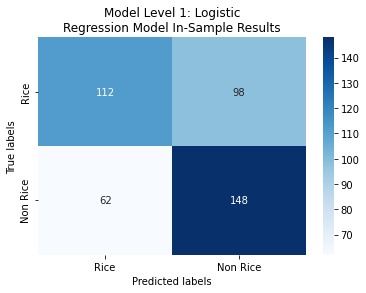

In [ ]:
plot_confusion_matrix(y_train,insample_predictions,"Model Level 1: Logistic\nRegression Model In-Sample Results",['Rice', 'Non Rice'])

In [ ]:
outsample_predictions = model.predict(X_test)

In [ ]:
print("Accuracy {0:.2f}%".format(100*accuracy_score(outsample_predictions, y_test)))
print(classification_report(y_test, outsample_predictions))

Accuracy 55.00%
              precision    recall  f1-score   support

    Non Rice       0.56      0.49      0.52        90
        Rice       0.54      0.61      0.58        90

    accuracy                           0.55       180
   macro avg       0.55      0.55      0.55       180
weighted avg       0.55      0.55      0.55       180



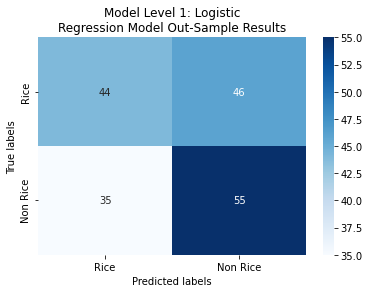

In [ ]:
plot_confusion_matrix(y_test, outsample_predictions,"Model Level 1: Logistic\nRegression Model Out-Sample Results",['Rice', 'Non Rice'])

In [ ]:
location = '/content/drive/MyDrive/EY_Challenge/Level 1 Crop Identification/challenge_1_submission_template_correct_columns_fixed.csv'
sub_data = pd.read_csv(location)
sub_data

,id,target
0,"(10.18019073690894, 105.32022315786804)",NaN
1,"(10.561107033461816, 105.12772097986661)",NaN
2,"(10.623790611954897, 105.13771401411867)",NaN
3,"(10.583364246115156, 105.23946127195805)",NaN
4,"(10.20744446668854, 105.26844107128906)",NaN
...,...,...
245,"(10.308283266873062, 105.50872812216863)",NaN
246,"(10.582910017285496, 105.23991550078767)",NaN
247,"(10.581547330796518, 105.23991550078767)",NaN
248,"(10.629241357910818, 105.15315779432643)",NaN


In [ ]:
# Supress Warnings 
import warnings
warnings.filterwarnings('ignore')

# Import common GIS tools
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import rioxarray as rio
import rasterio.features

# Import Planetary Computer tools
import stackstac
import pystac_client
import planetary_computer as pc
#import xrspatial.multispectral as ms
import odc
from odc.stac import stac_load

# Pass your API key here
pc.settings.set_subscription_key('a3c4c316e87343409b76ed38fbd23967')

In [ ]:
resolution = 10  # meters per pixel 
scale = resolution / 111320.0 # degrees per pixel for crs=4326 
time_of_interest = "2021-12-01/2022-04-30"
box_size_deg = 0.0004 # Surrounding box in degrees, yields approximately 5x5 pixel region


In [ ]:
def get_data(latlong):
  latlong=latlong.replace('(','').replace(')','').replace(' ','').split(',')
  lat_long = float(latlong[0] ), float(latlong[1])
  min_lon = lat_long[1]-box_size_deg/2
  min_lat = lat_long[0]-box_size_deg/2
  max_lon = lat_long[1]+box_size_deg/2
  max_lat = lat_long[0]+box_size_deg/2

  bbox = (min_lon, min_lat, max_lon, max_lat)
  catalog = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")
  search = catalog.search(collections=["sentinel-1-rtc"], bbox=bbox, datetime=time_of_interest)
  items = list(search.get_all_items()) # This produces a list of scene IDs
  data = stac_load(items,bands=["vv", "vh"], patch_url=pc.sign, bbox=bbox, crs="EPSG:4326", resolution=scale)
  mean = data.mean(dim=['latitude','longitude']).compute()
  dop = (mean.vv / (mean.vv + mean.vh))
  m = 1 - dop
  rvi = (np.sqrt(dop))*((4*mean.vh)/(mean.vv + mean.vh))
  return rvi

In [ ]:
def make_plot(latlong):
  fig = plt.figure(figsize=(10, 5))
  get_data(latlong).plot(color='green',marker='o',markersize=4,linewidth=2)
  plt.title("Mean RVI = Radar Vegetation Index")
  plt.xlabel("Date")
  plt.ylabel("RVI")
  plt.show()

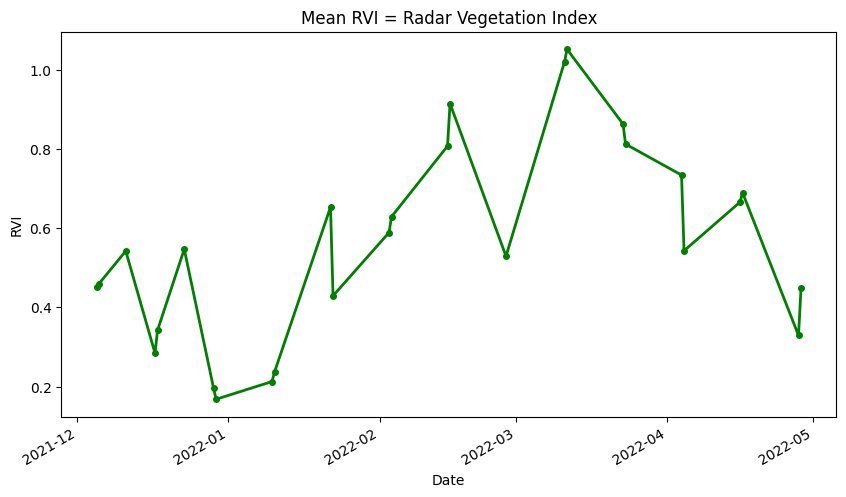

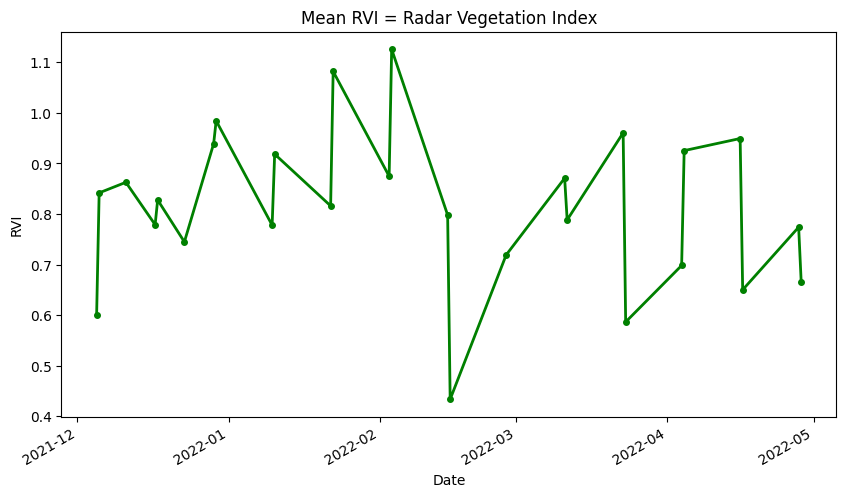

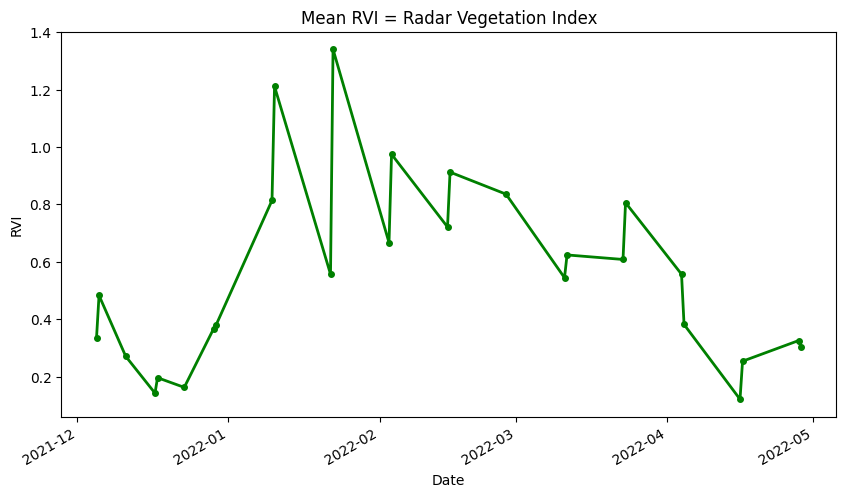

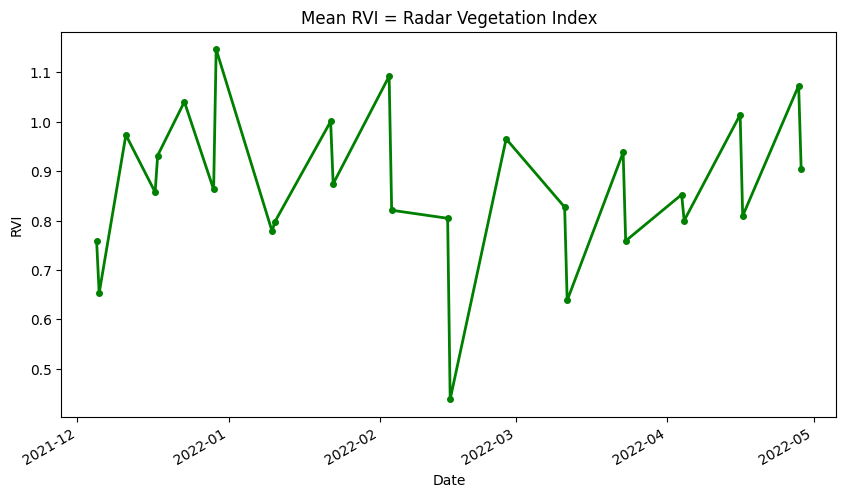

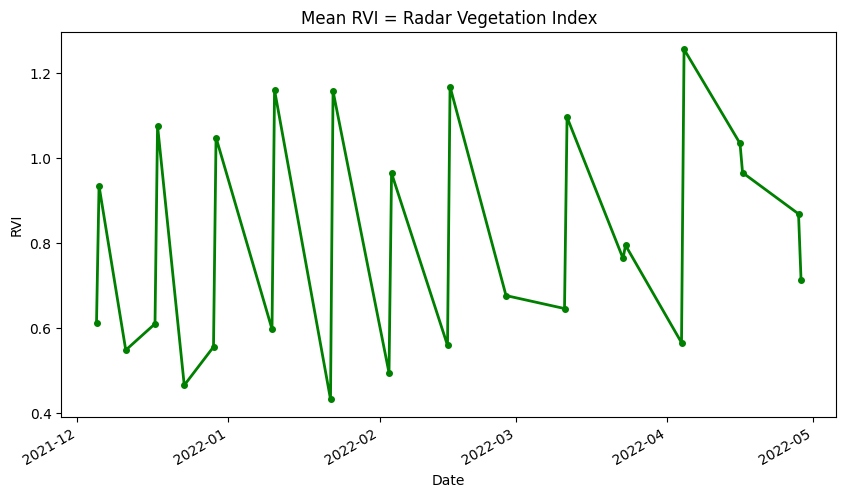

...

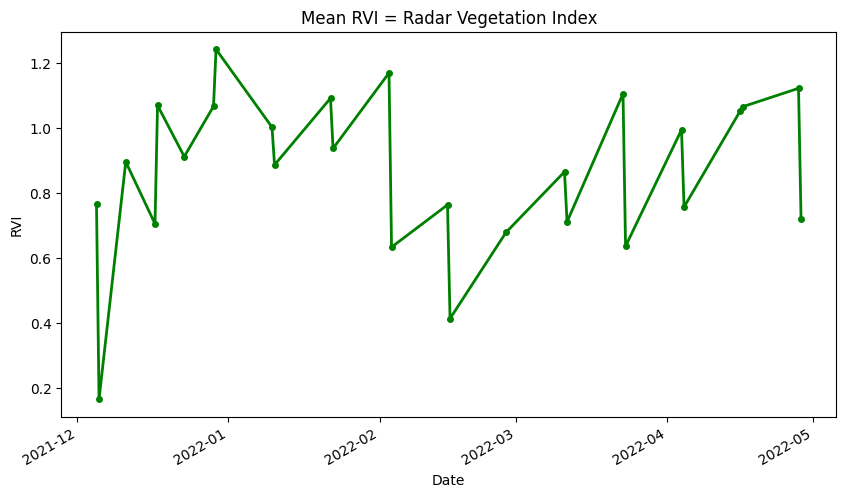

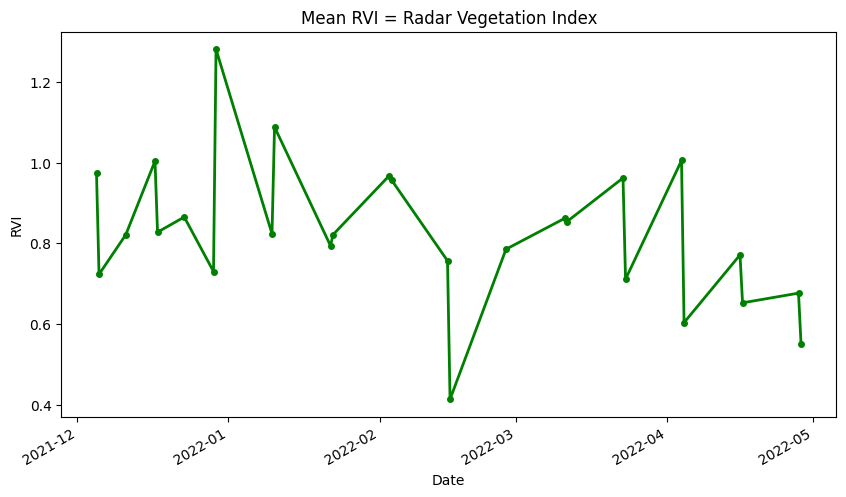

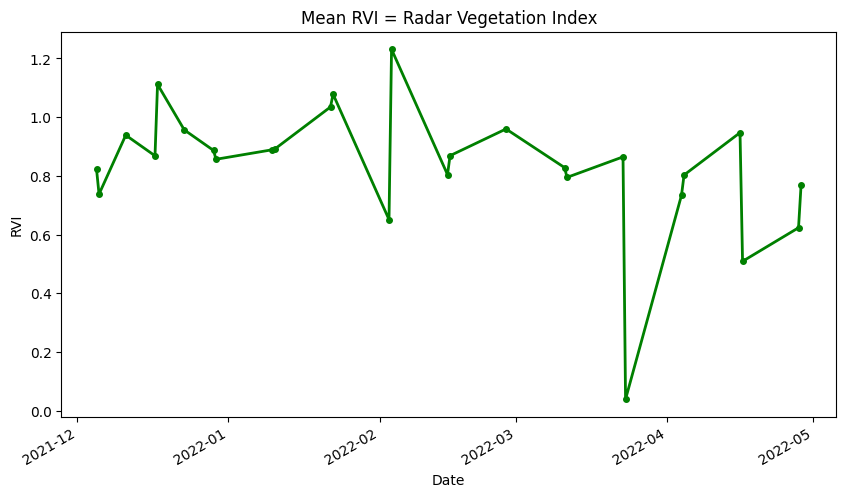

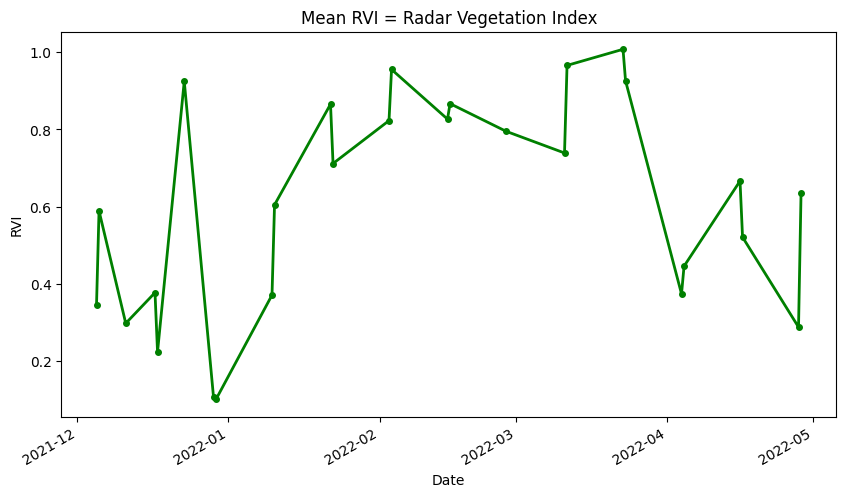

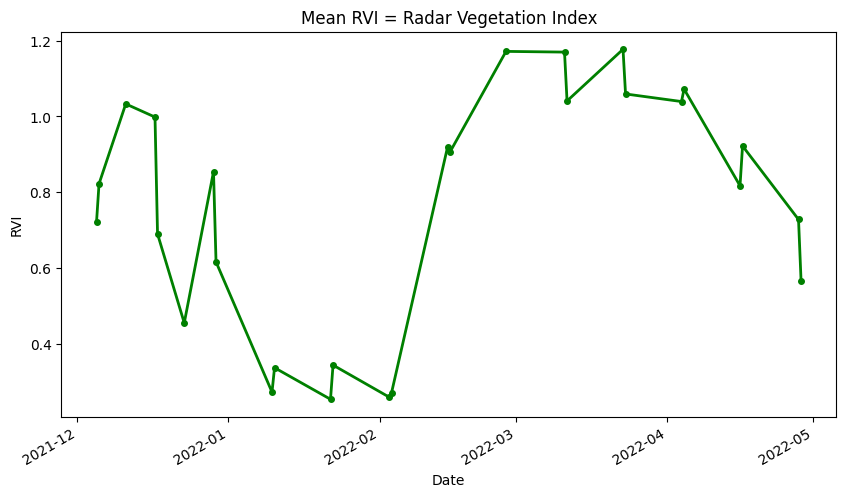

In [ ]:
make_plot(sub_data['id'][0])